In [1]:
import pandas as pd

In [5]:
df = pd.read_csv('moreData1.csv')

In [8]:
df

,Date/Time,Lat,Lon,Base
0,9/1/2014 0:01:00,40.2201,-74.0021,B02512
1,9/1/2014 0:01:00,40.7500,-74.0027,B02512
2,9/1/2014 0:03:00,40.7559,-73.9864,B02512
3,9/1/2014 0:06:00,40.7450,-73.9889,B02512
4,9/1/2014 0:11:00,40.8145,-73.9444,B02512
...,...,...,...,...
4451741,4/30/2014 23:22:00,40.7640,-73.9744,B02764
4451742,4/30/2014 23:26:00,40.7629,-73.9672,B02764
4451743,4/30/2014 23:31:00,40.7443,-73.9889,B02764
4451744,4/30/2014 23:32:00,40.6756,-73.9405,B02764


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4451746 entries, 0 to 4451745
Data columns (total 4 columns):
 #   Column     Dtype  
---  ------     -----  
 0   Date/Time  object 
 1   Lat        float64
 2   Lon        float64
 3   Base       object 
dtypes: float64(2), object(2)
memory usage: 135.9+ MB


In [9]:
df['convert_dates'] = pd.to_datetime(df['Date/Time'], format='%m/%d/%Y %H:%M:%S')

In [12]:
df.head(2)

,Date/Time,Lat,Lon,Base,convert_dates
0,9/1/2014 0:01:00,40.2201,-74.0021,B02512,2014-09-01 00:01:00
1,9/1/2014 0:01:00,40.7500,-74.0027,B02512,2014-09-01 00:01:00


In [14]:
df['years'] = df['convert_dates'].dt.year
df['months'] = df['convert_dates'].dt.month
df['weekday'] = df['convert_dates'].dt.day_name()
df['hours'] = df['convert_dates'].dt.hour
df['minutes'] = df['convert_dates'].dt.minute
df['seconds'] = df['convert_dates'].dt.second

In [15]:
df.head(2)

,Date/Time,Lat,Lon,Base,convert_dates,years,months,weekday,hours,minutes,seconds
0,9/1/2014 0:01:00,40.2201,-74.0021,B02512,2014-09-01 00:01:00,2014,9,Monday,0,1,0
1,9/1/2014 0:01:00,40.7500,-74.0027,B02512,2014-09-01 00:01:00,2014,9,Monday,0,1,0


In [17]:
rush_uber = df.groupby(['Lat', 'Lon'], as_index=False).size()

In [18]:
rush_uber.head(2)

,Lat,Lon,size
0,39.6569,-74.2258,1
1,39.6686,-74.1607,1


In [19]:
!pip install folium

     ------------------------------------- 102.3/102.3 kB 84.1 kB/s eta 0:00:00


In [20]:
import folium

In [26]:
basemap = folium.Map()

In [25]:
from folium.plugins import HeatMap      

In [27]:
HeatMap(rush_uber).add_to(basemap)

In [28]:
basemap

In [29]:
 rush_uber.head(2)

,Lat,Lon,size
0,39.6569,-74.2258,1
1,39.6686,-74.1607,1


In [30]:
df.head(2)

,Date/Time,Lat,Lon,Base,convert_dates,years,months,weekday,hours,minutes,seconds
0,9/1/2014 0:01:00,40.2201,-74.0021,B02512,2014-09-01 00:01:00,2014,9,Monday,0,1,0
1,9/1/2014 0:01:00,40.7500,-74.0027,B02512,2014-09-01 00:01:00,2014,9,Monday,0,1,0


In [40]:
df['week'] = df['convert_dates'].dt.day

In [41]:
df

,Date/Time,Lat,Lon,Base,convert_dates,years,months,weekday,hours,minutes,seconds,week
0,9/1/2014 0:01:00,40.2201,-74.0021,B02512,2014-09-01 00:01:00,2014,9,Monday,0,1,0,1
1,9/1/2014 0:01:00,40.7500,-74.0027,B02512,2014-09-01 00:01:00,2014,9,Monday,0,1,0,1
2,9/1/2014 0:03:00,40.7559,-73.9864,B02512,2014-09-01 00:03:00,2014,9,Monday,0,3,0,1
3,9/1/2014 0:06:00,40.7450,-73.9889,B02512,2014-09-01 00:06:00,2014,9,Monday,0,6,0,1
4,9/1/2014 0:11:00,40.8145,-73.9444,B02512,2014-09-01 00:11:00,2014,9,Monday,0,11,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4451741,4/30/2014 23:22:00,40.7640,-73.9744,B02764,2014-04-30 23:22:00,2014,4,Wednesday,23,22,0,30
4451742,4/30/2014 23:26:00,40.7629,-73.9672,B02764,2014-04-30 23:26:00,2014,4,Wednesday,23,26,0,30
4451743,4/30/2014 23:31:00,40.7443,-73.9889,B02764,2014-04-30 23:31:00,2014,4,Wednesday,23,31,0,30
4451744,4/30/2014 23:32:00,40.6756,-73.9405,B02764,2014-04-30 23:32:00,2014,4,Wednesday,23,32,0,30


In [42]:
day_rush_uber = df.groupby(['week', 'hours']).size().unstack()

<AxesSubplot:xlabel='hours', ylabel='week'>

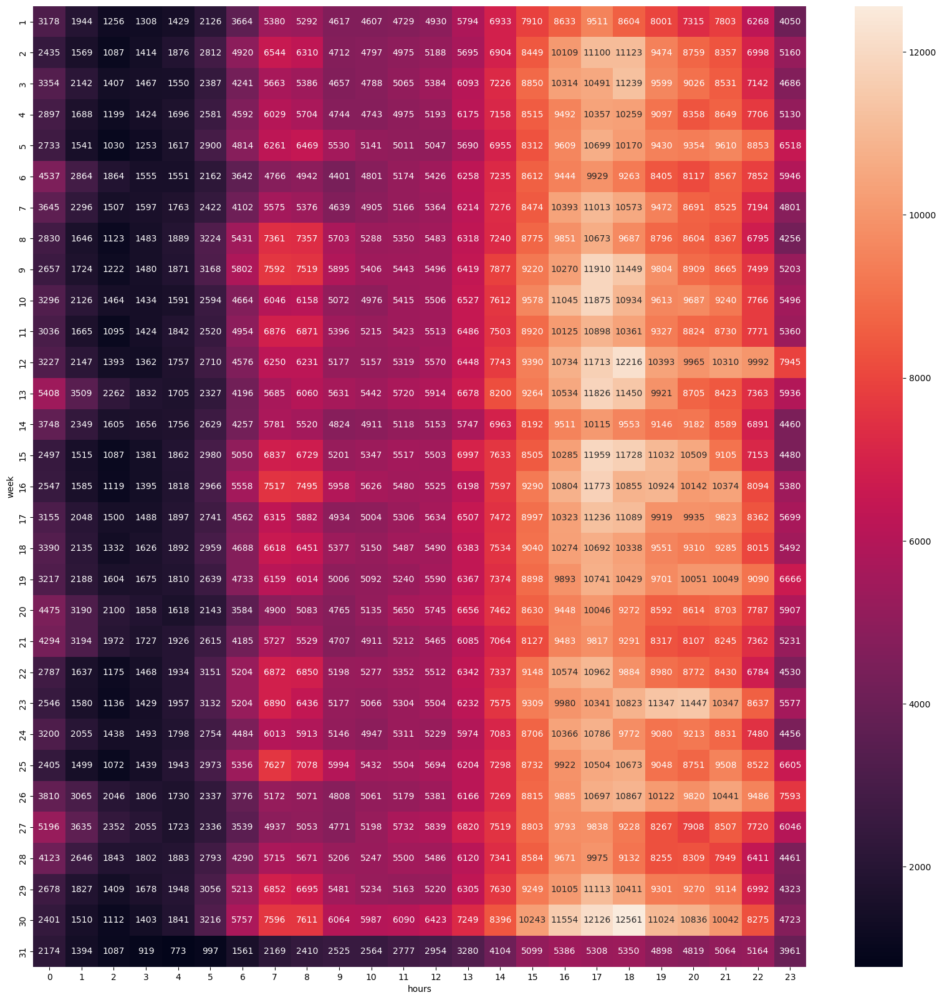

In [53]:
plt.figure(figsize=(20,20))
sns.heatmap(day_rush_uber, annot=True, fmt='d')

In [50]:
import seaborn as sns
import matplotlib.pyplot as plt

In [54]:
day_rush_uber1 = df.groupby(['weekday', 'hours']).size().unstack()

<AxesSubplot:xlabel='hours', ylabel='weekday'>

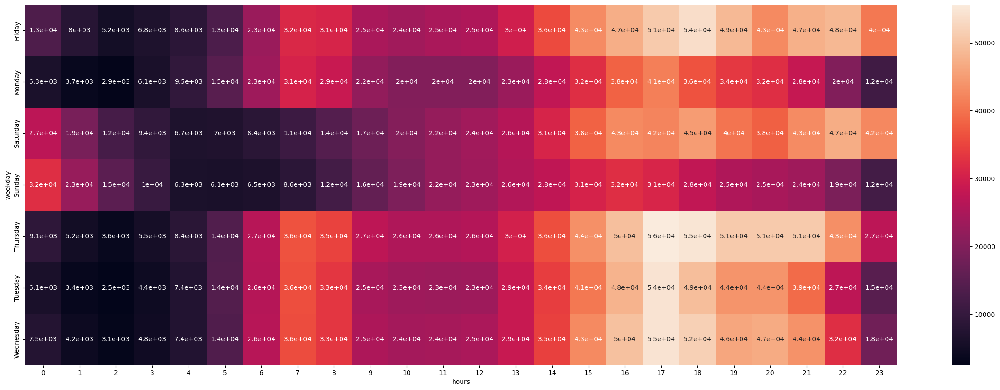

In [61]:
plt.figure(figsize=(30,10))
sns.heatmap(day_rush_uber1, annot=True)